In [1]:
    # Hierarchical clustering

In [2]:
import pandas as pd
import numpy as np
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler,MinMaxScaler
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
plt.rcParams['figure.figsize']=(15,12)
plt.rcParams['figure.dpi']=600
plt.tight_layout()

<Figure size 9000x7200 with 0 Axes>

In [3]:
df=pd.read_csv('/content/EastWestAirlines_csv.csv')

In [4]:
df

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,1,28143,0,1,1,1,174,1,0,0,7000,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3994,4017,18476,0,1,1,1,8525,4,200,1,1403,1
3995,4018,64385,0,1,1,1,981,5,0,0,1395,1
3996,4019,73597,0,3,1,1,25447,8,0,0,1402,1
3997,4020,54899,0,1,1,1,500,1,500,1,1401,0


In [5]:
df.describe()

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
count,3999.000000,3.999000e+03,3999.000000,3999.000000,3999.000000,3999.000000,3999.000000,3999.00000,3999.000000,3999.000000,3999.00000,3999.000000
mean,2014.819455,7.360133e+04,144.114529,2.059515,1.014504,1.012253,17144.846212,11.60190,460.055764,1.373593,4118.55939,0.370343
std,1160.764358,1.007757e+05,773.663804,1.376919,0.147650,0.195241,24150.967826,9.60381,1400.209171,3.793172,2065.13454,0.482957
min,1.000000,0.000000e+00,0.000000,1.000000,1.000000,1.000000,0.000000,0.00000,0.000000,0.000000,2.00000,0.000000
25%,1010.500000,1.852750e+04,0.000000,1.000000,1.000000,1.000000,1250.000000,3.00000,0.000000,0.000000,2330.00000,0.000000
50%,2016.000000,4.309700e+04,0.000000,1.000000,1.000000,1.000000,7171.000000,12.00000,0.000000,0.000000,4096.00000,0.000000
75%,3020.500000,9.240400e+04,0.000000,3.000000,1.000000,1.000000,23800.500000,17.00000,311.000000,1.000000,5790.50000,1.000000
max,4021.000000,1.704838e+06,11148.000000,5.000000,3.000000,5.000000,263685.000000,86.00000,30817.000000,53.000000,8296.00000,1.000000


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3999 entries, 0 to 3998
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   ID#                3999 non-null   int64
 1   Balance            3999 non-null   int64
 2   Qual_miles         3999 non-null   int64
 3   cc1_miles          3999 non-null   int64
 4   cc2_miles          3999 non-null   int64
 5   cc3_miles          3999 non-null   int64
 6   Bonus_miles        3999 non-null   int64
 7   Bonus_trans        3999 non-null   int64
 8   Flight_miles_12mo  3999 non-null   int64
 9   Flight_trans_12    3999 non-null   int64
 10  Days_since_enroll  3999 non-null   int64
 11  Award?             3999 non-null   int64
dtypes: int64(12)
memory usage: 375.0 KB


In [7]:
df.duplicated().sum()

0

In [8]:
df=df.drop(columns='ID#')

In [9]:
df

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,28143,0,1,1,1,174,1,0,0,7000,0
1,19244,0,1,1,1,215,2,0,0,6968,0
2,41354,0,1,1,1,4123,4,0,0,7034,0
3,14776,0,1,1,1,500,1,0,0,6952,0
4,97752,0,4,1,1,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...,...,...
3994,18476,0,1,1,1,8525,4,200,1,1403,1
3995,64385,0,1,1,1,981,5,0,0,1395,1
3996,73597,0,3,1,1,25447,8,0,0,1402,1
3997,54899,0,1,1,1,500,1,500,1,1401,0


In [10]:
sc=MinMaxScaler()
df_scale=sc.fit_transform(df)

In [11]:
df_scale

array([[0.01650773, 0.        , 0.        , ..., 0.        , 0.84374246,
        0.        ],
       [0.01128788, 0.        , 0.        , ..., 0.        , 0.83988425,
        0.        ],
       [0.02425685, 0.        , 0.        , ..., 0.        , 0.84784181,
        0.        ],
       ...,
       [0.0431695 , 0.        , 0.5       , ..., 0.        , 0.16879672,
        1.        ],
       [0.03220189, 0.        , 0.        , ..., 0.01886792, 0.16867615,
        0.        ],
       [0.00176908, 0.        , 0.        , ..., 0.        , 0.16831444,
        0.        ]])

In [12]:
df_scale=pd.DataFrame(df_scale,columns=['Balance','Qual_miles',	'cc1_miles',	'cc2_miles',	'cc3_miles',	'Bonus_miles',	'Bonus_trans',	'Flight_miles_12mo',	'Flight_trans_12',	'Days_since_enroll','Award?'])

In [13]:
df_scale

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,0.016508,0.0,0.00,0.0,0.0,0.000660,0.011628,0.000000,0.000000,0.843742,0.0
1,0.011288,0.0,0.00,0.0,0.0,0.000815,0.023256,0.000000,0.000000,0.839884,0.0
2,0.024257,0.0,0.00,0.0,0.0,0.015636,0.046512,0.000000,0.000000,0.847842,0.0
3,0.008667,0.0,0.00,0.0,0.0,0.001896,0.011628,0.000000,0.000000,0.837955,0.0
4,0.057338,0.0,0.75,0.0,0.0,0.164211,0.302326,0.067398,0.075472,0.835905,1.0
...,...,...,...,...,...,...,...,...,...,...,...
3994,0.010837,0.0,0.00,0.0,0.0,0.032330,0.046512,0.006490,0.018868,0.168917,1.0
3995,0.037766,0.0,0.00,0.0,0.0,0.003720,0.058140,0.000000,0.000000,0.167953,1.0
3996,0.043169,0.0,0.50,0.0,0.0,0.096505,0.093023,0.000000,0.000000,0.168797,1.0
3997,0.032202,0.0,0.00,0.0,0.0,0.001896,0.011628,0.016225,0.018868,0.168676,0.0


In [14]:
df_scale['cc2_miles'].value_counts()

cc2_miles
0.0    3956
0.5      28
1.0      15
Name: count, dtype: int64

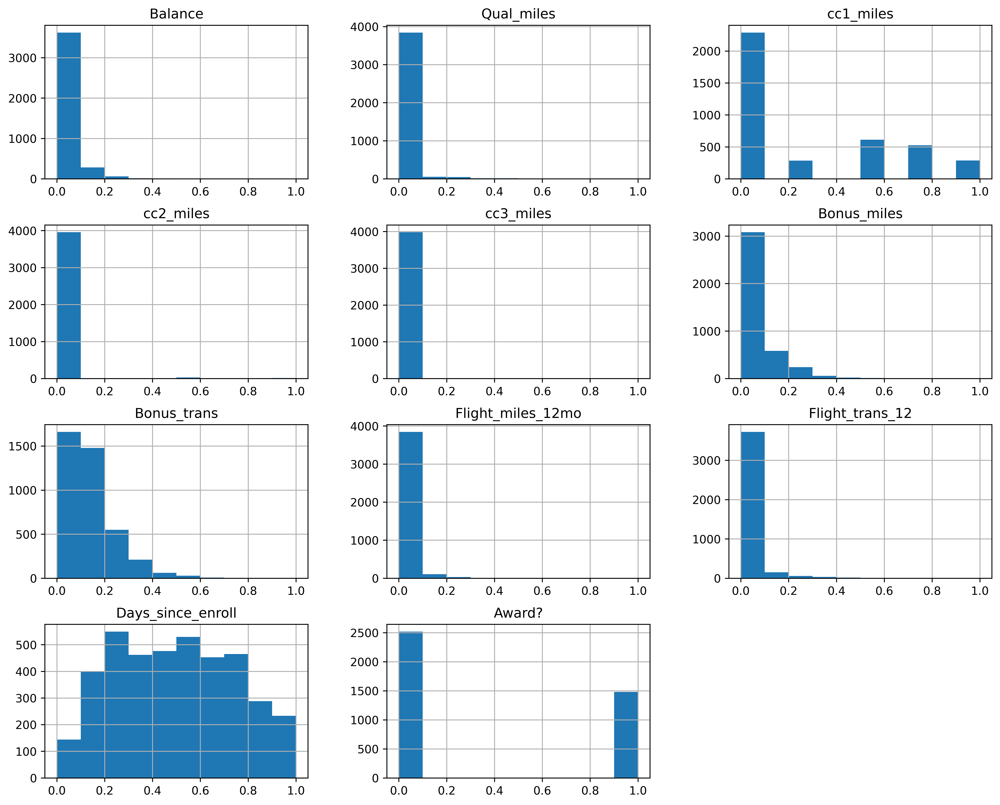

In [15]:
df_scale.hist()
plt.show()

<Axes: >

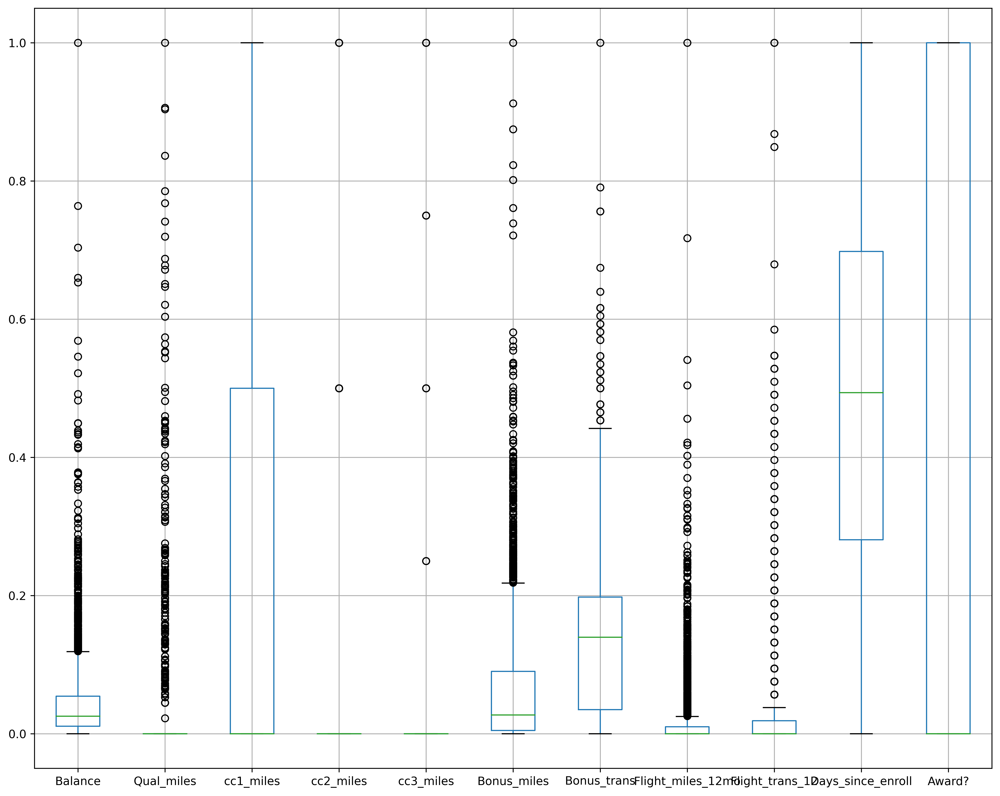

In [16]:
df_scale.boxplot()

In [17]:
def outlier_detection(data,colname):
  q1=data[colname].quantile(0.25)
  q2=data[colname].quantile(0.75)
  iqr=q2-q1
  upper_extr=q2+(1.5*iqr)
  lower_extr=q1-(1.5*iqr)
  return upper_extr,lower_extr

In [18]:
outlier_detection(df_scale,'Balance')

(0.11920120856057877, -0.05413256274203179)

In [19]:
df_scale.loc[df_scale['Balance']>0.11,'Balance']=0.11

In [20]:
df_scale[df_scale['Balance']==0.11]

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
8,0.11,0.000000,0.50,0.5,0.0,0.006648,0.500000,0.124931,0.226415,0.837473,1.0
24,0.11,0.044851,0.00,0.0,0.0,0.015264,0.244186,0.022715,0.075472,0.956113,0.0
32,0.11,0.000000,0.75,0.0,0.0,0.159448,0.267442,0.000000,0.000000,0.948879,0.0
43,0.11,0.000000,0.50,0.0,0.0,0.056916,0.162791,0.000000,0.000000,0.942489,1.0
45,0.11,0.086742,0.00,0.0,0.0,0.089501,0.162791,0.064899,0.075472,0.829756,1.0
...,...,...,...,...,...,...,...,...,...,...,...
3756,0.11,0.000000,0.00,0.0,0.0,0.053094,0.151163,0.129798,0.150943,0.428623,1.0
3772,0.11,0.000000,1.00,0.0,0.0,0.524618,0.302326,0.019470,0.037736,0.396190,1.0
3788,0.11,0.000000,0.00,0.5,0.0,0.089470,0.360465,0.162248,0.264151,0.417290,1.0
3839,0.11,0.000000,0.00,0.0,0.0,0.019565,0.058140,0.000000,0.000000,0.201350,0.0


In [21]:
outlier_detection(df_scale,'Qual_miles')

(0.0, 0.0)

In [22]:
df_scale.loc[df_scale['Qual_miles']>0.0,'Qual_miles']=0.0

In [23]:
outlier_detection(df_scale,'cc2_miles')

(0.0, 0.0)

In [24]:
df_scale.columns

Index(['Balance', 'Qual_miles', 'cc1_miles', 'cc2_miles', 'cc3_miles',
       'Bonus_miles', 'Bonus_trans', 'Flight_miles_12mo', 'Flight_trans_12',
       'Days_since_enroll', 'Award?'],
      dtype='object')

In [25]:
df_scale.loc[df_scale['cc2_miles']>0.0,'cc2_miles']=0.0


In [26]:
outlier_detection(df_scale,'cc3_miles')

(0.0, 0.0)

In [27]:
df_scale.loc[df_scale['cc3_miles']>0.0,'cc3_miles']=0.0

In [28]:
outlier_detection(df_scale,'Bonus_miles')

(0.21854201035326243, -0.12354039858164098)

In [29]:
df_scale.loc[df_scale['Bonus_miles']>0.21,'Bonus_miles']=0.21

In [30]:
outlier_detection(df_scale,'Bonus_trans')

(0.4418604651162791, -0.20930232558139533)

In [31]:
df_scale.loc[df_scale['Bonus_trans']>0.44,'Bonus_trans']=0.44

In [32]:
outlier_detection(df_scale,'Flight_miles_12mo')

(0.025229581075380474, -0.015137748645228285)

In [33]:
df_scale.loc[df_scale['Flight_miles_12mo']>0.02,'Flight_miles_12mo']=0.02

In [34]:
outlier_detection(df_scale,'Flight_trans_12')

(0.04716981132075472, -0.02830188679245283)

In [35]:
df_scale.loc[df_scale['Flight_trans_12']>0.04,'Flight_trans_12']=0.04

<Axes: >

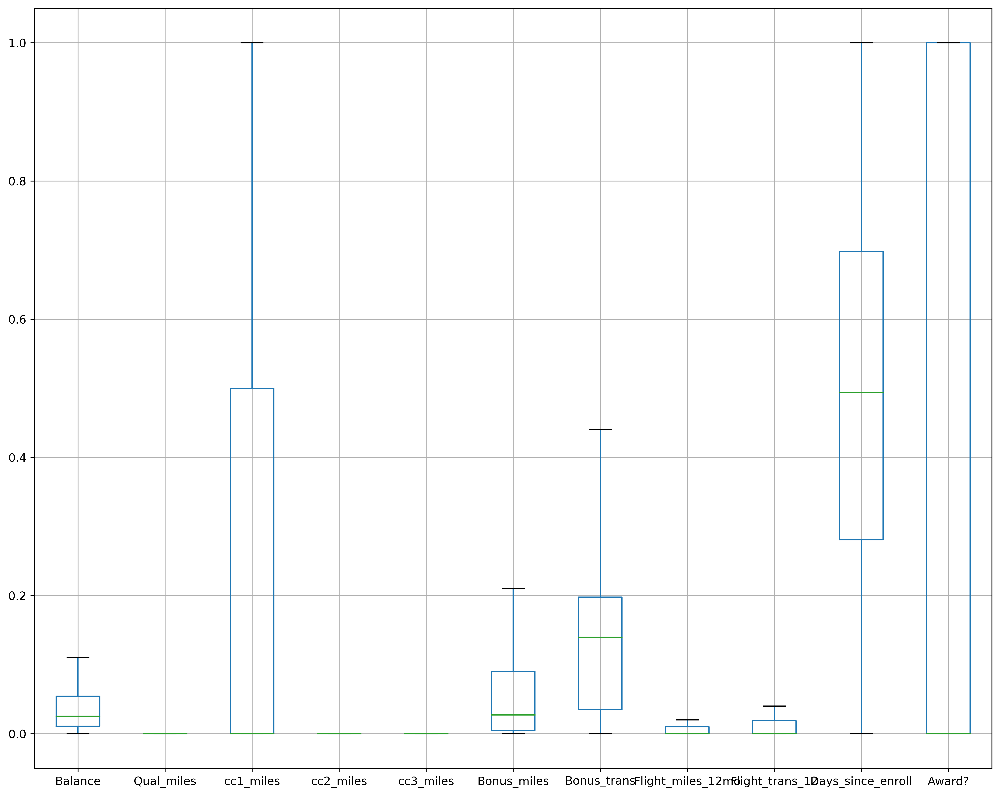

In [36]:
df_scale.boxplot()

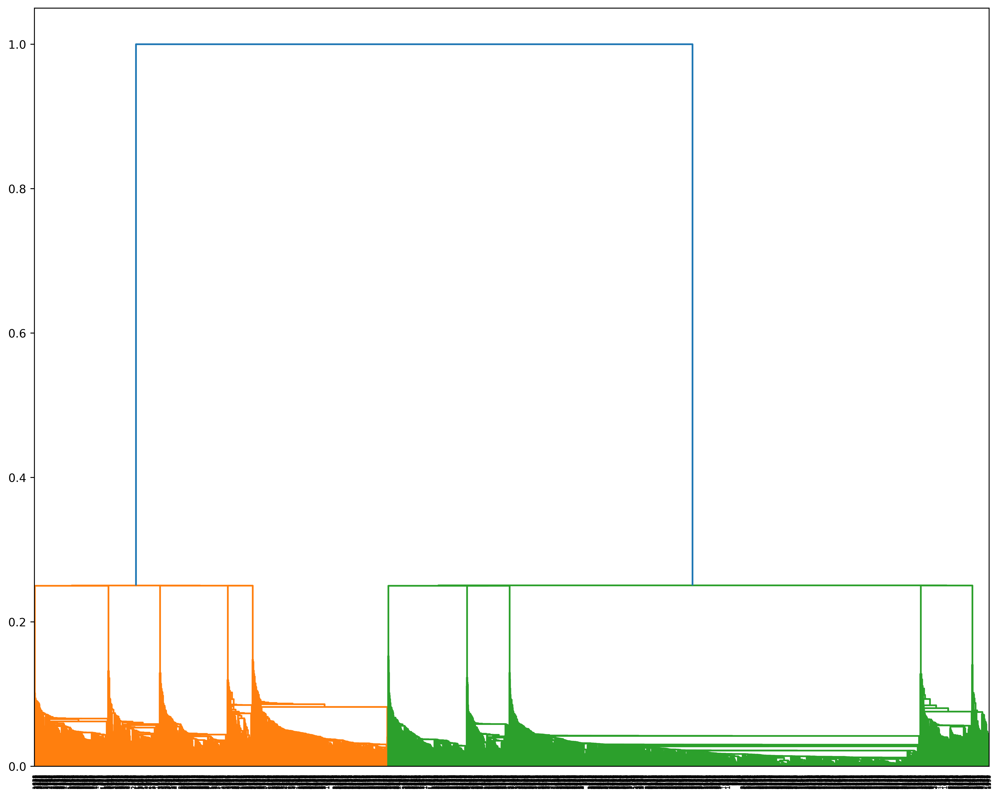

In [37]:
dendro=sch.dendrogram(sch.linkage(df_scale,method='single'))

In [38]:
hc=AgglomerativeClustering(n_clusters=2,metric='euclidean',linkage='single')

In [39]:
y_hc=hc.fit_predict(df_scale)

In [84]:
y_hc

array([0, 0, 0, ..., 1, 0, 0])

In [85]:
silhouette_score(df_scale,y_hc)

0.6311773920049866

In [86]:
hc=AgglomerativeClustering(n_clusters=2,metric='minkowski',linkage='complete')

In [87]:
y_hc=hc.fit_predict(df_scale)
y_hc

array([1, 1, 1, ..., 0, 1, 1])

In [88]:
silhouette_score(df_scale,y_hc)

0.40608890491477717

In [89]:
hc=AgglomerativeClustering(n_clusters=2,metric='correlation',linkage='average')

In [90]:
y_hc=hc.fit_predict(df_scale)
y_hc

array([0, 0, 0, ..., 1, 0, 0])

In [91]:
silhouette_score(df_scale,y_hc)

0.6311773920049866

In [42]:
#K-Means Clustering

In [43]:
from sklearn.cluster import KMeans

In [44]:
df_scale

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,0.016508,0.0,0.00,0.0,0.0,0.000660,0.011628,0.000000,0.000000,0.843742,0.0
1,0.011288,0.0,0.00,0.0,0.0,0.000815,0.023256,0.000000,0.000000,0.839884,0.0
2,0.024257,0.0,0.00,0.0,0.0,0.015636,0.046512,0.000000,0.000000,0.847842,0.0
3,0.008667,0.0,0.00,0.0,0.0,0.001896,0.011628,0.000000,0.000000,0.837955,0.0
4,0.057338,0.0,0.75,0.0,0.0,0.164211,0.302326,0.020000,0.040000,0.835905,1.0
...,...,...,...,...,...,...,...,...,...,...,...
3994,0.010837,0.0,0.00,0.0,0.0,0.032330,0.046512,0.006490,0.018868,0.168917,1.0
3995,0.037766,0.0,0.00,0.0,0.0,0.003720,0.058140,0.000000,0.000000,0.167953,1.0
3996,0.043169,0.0,0.50,0.0,0.0,0.096505,0.093023,0.000000,0.000000,0.168797,1.0
3997,0.032202,0.0,0.00,0.0,0.0,0.001896,0.011628,0.016225,0.018868,0.168676,0.0


In [45]:
wcss=[]
for i in range(1,11):
  kmeans=KMeans(n_clusters=i,init='k-means++',max_iter=300,random_state=1)
  kmeans.fit(df_scale)
  wcss.append(kmeans.inertia_)

In [46]:
wcss

[1722.524688680427,
 719.7730213193722,
 522.2134955925031,
 336.94558438284776,
 249.19346859348448,
 216.7249145204474,
 189.41686027927807,
 164.81924741738982,
 149.56990007948087,
 131.74679074646224]

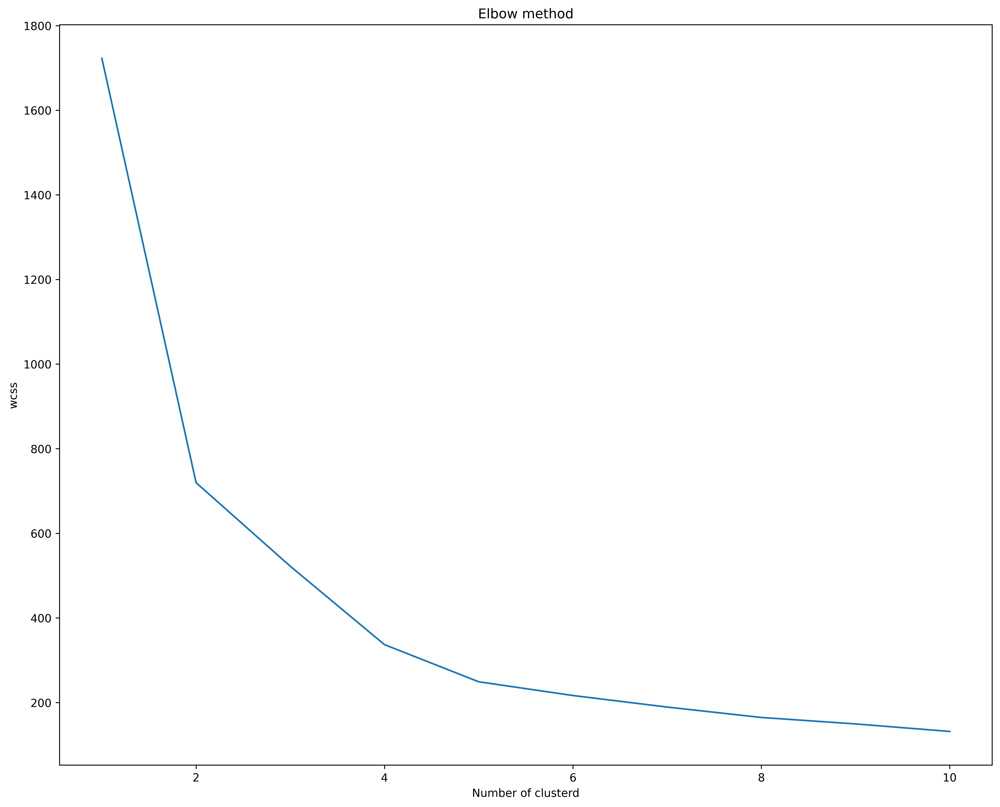

In [47]:
plt.plot(range(1,11),wcss)
plt.title('Elbow method')
plt.xlabel('Number of clusterd')
plt.ylabel('wcss')
plt.show()

In [48]:
kmeans=KMeans(n_clusters=2,random_state=1)
predict1=kmeans.fit_predict(df_scale)

In [49]:
predict1

array([1, 1, 1, ..., 0, 1, 1], dtype=int32)

In [50]:
kmeans=KMeans(n_clusters=4,random_state=1)
predict2=kmeans.fit_predict(df_scale)

In [51]:
predict2

array([3, 3, 3, ..., 2, 3, 3], dtype=int32)

In [52]:
# DBSCAN Algorithm

In [53]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

In [54]:
sns.pairplot(df_scale)

In [55]:
# DBSCAN without Hyperparameter

In [56]:
dbscan=DBSCAN()
y=dbscan.fit_predict(df_scale)

In [57]:
y

array([0, 0, 0, ..., 1, 0, 0])

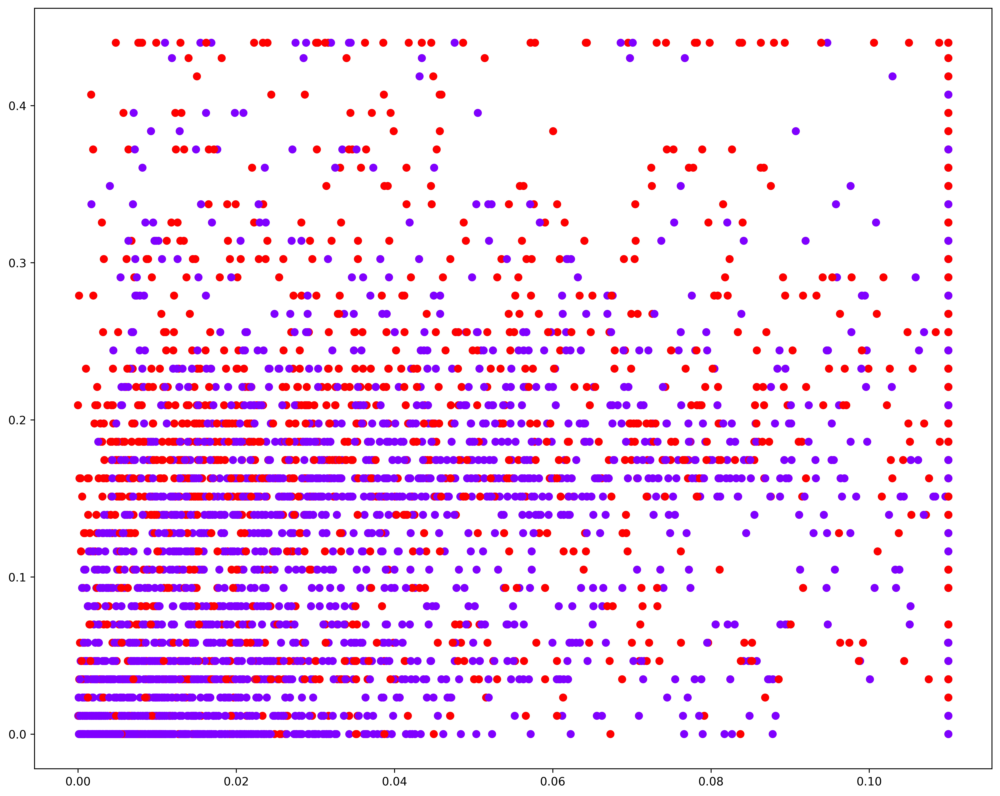

In [58]:
plt.scatter(df_scale['Balance'],df_scale['Bonus_trans'],cmap='rainbow',c=y)

In [59]:
silhouette_score(df_scale,y)

0.5573740184486992

In [60]:
# Hperparameter tuning

In [61]:
df_scale

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,0.016508,0.0,0.00,0.0,0.0,0.000660,0.011628,0.000000,0.000000,0.843742,0.0
1,0.011288,0.0,0.00,0.0,0.0,0.000815,0.023256,0.000000,0.000000,0.839884,0.0
2,0.024257,0.0,0.00,0.0,0.0,0.015636,0.046512,0.000000,0.000000,0.847842,0.0
3,0.008667,0.0,0.00,0.0,0.0,0.001896,0.011628,0.000000,0.000000,0.837955,0.0
4,0.057338,0.0,0.75,0.0,0.0,0.164211,0.302326,0.020000,0.040000,0.835905,1.0
...,...,...,...,...,...,...,...,...,...,...,...
3994,0.010837,0.0,0.00,0.0,0.0,0.032330,0.046512,0.006490,0.018868,0.168917,1.0
3995,0.037766,0.0,0.00,0.0,0.0,0.003720,0.058140,0.000000,0.000000,0.167953,1.0
3996,0.043169,0.0,0.50,0.0,0.0,0.096505,0.093023,0.000000,0.000000,0.168797,1.0
3997,0.032202,0.0,0.00,0.0,0.0,0.001896,0.011628,0.016225,0.018868,0.168676,0.0


In [62]:
df_scale.shape[1]

11

In [63]:
from sklearn.neighbors import NearestNeighbors

In [64]:
neighbors=NearestNeighbors(n_neighbors=11).fit(df_scale)

In [65]:
d,index=neighbors.kneighbors(df_scale)

In [66]:
neighbors.kneighbors(df_scale)

(array([[0.        , 0.00871531, 0.00982329, ..., 0.0169149 , 0.0190791 ,
         0.02126834],
        [0.        , 0.01212297, 0.01331785, ..., 0.02338798, 0.02353866,
         0.02424792],
        [0.        , 0.01857767, 0.01872551, ..., 0.03579654, 0.03660932,
         0.03693779],
        ...,
        [0.        , 0.02591961, 0.04945468, ..., 0.08659554, 0.08850461,
         0.09422899],
        [0.        , 0.0264501 , 0.02784951, ..., 0.03385595, 0.03464224,
         0.03555204],
        [0.        , 0.00038605, 0.0027753 , ..., 0.00987097, 0.01282535,
         0.01402924]]),
 array([[   0,  363,    3, ...,   14,  358,   54],
        [   1,    3,    0, ...,  350,    5,   14],
        [   2,  338,  344, ...,  376,   55,   83],
        ...,
        [3996, 3877, 3830, ..., 3871, 2914, 3263],
        [3997, 3970, 3968, ..., 3242, 3940, 3368],
        [3998, 3491, 3455, ..., 3964, 3591, 3374]]))

In [67]:
distance=np.sort(d[:,1])

Text(0.5, 1.0, 'K-Distance plot')

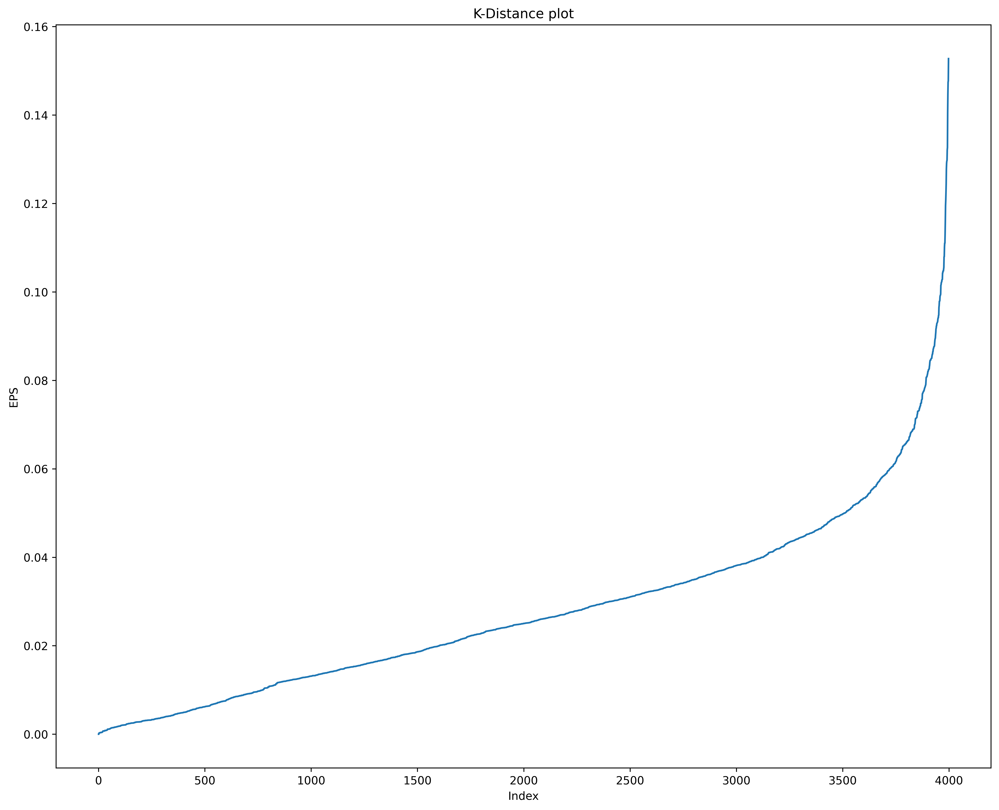

In [68]:
plt.plot(distance)
plt.xlabel('Index')
plt.ylabel('EPS')
plt.title('K-Distance plot')

In [69]:
db=DBSCAN(eps=0.04,min_samples=20)
yp=db.fit_predict(df_scale)

In [70]:
yp

array([ 0,  0,  0, ..., -1,  0,  0])

In [71]:
silhouette_score(df_scale,yp)

0.007950220207383514

In [72]:
df_scale['Cluster1']=y_hc

In [73]:
df_scale['cluster2']=predict1

In [74]:
df_scale['cluster3']=yp

In [75]:
df_scale

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,Cluster1,cluster2,cluster3
0,0.016508,0.0,0.00,0.0,0.0,0.000660,0.011628,0.000000,0.000000,0.843742,0.0,0,1,0
1,0.011288,0.0,0.00,0.0,0.0,0.000815,0.023256,0.000000,0.000000,0.839884,0.0,0,1,0
2,0.024257,0.0,0.00,0.0,0.0,0.015636,0.046512,0.000000,0.000000,0.847842,0.0,0,1,0
3,0.008667,0.0,0.00,0.0,0.0,0.001896,0.011628,0.000000,0.000000,0.837955,0.0,0,1,0
4,0.057338,0.0,0.75,0.0,0.0,0.164211,0.302326,0.020000,0.040000,0.835905,1.0,1,0,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3994,0.010837,0.0,0.00,0.0,0.0,0.032330,0.046512,0.006490,0.018868,0.168917,1.0,1,0,-1
3995,0.037766,0.0,0.00,0.0,0.0,0.003720,0.058140,0.000000,0.000000,0.167953,1.0,1,0,-1
3996,0.043169,0.0,0.50,0.0,0.0,0.096505,0.093023,0.000000,0.000000,0.168797,1.0,1,0,-1
3997,0.032202,0.0,0.00,0.0,0.0,0.001896,0.011628,0.016225,0.018868,0.168676,0.0,0,1,0
